In [1]:
import os
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
warnings.filterwarnings("ignore")
pd.set_option("display.max_rows",None)
from sklearn import preprocessing
import matplotlib
matplotlib.style.use('ggplot')
from sklearn.preprocessing import LabelEncoder


In [2]:
df = pd.read_csv('Flight_Schedule_Report (1) (1).csv')

In [3]:
df

,Flight,Origin,To,Scheduled Start Date,Scheduled End Date,Dep. Time,Arr. Time,Via/ Connection,Days
0,I51426/I52461,LKO,MAA,01-07-2023,28-10-2023,9:45 AM,5:05 PM,LKO/BLR BLR/MAA,Sat
1,I51426/I52461,LKO,MAA,01-07-2023,28-10-2023,9:45 AM,5:05 PM,LKO/BLR BLR/MAA,Mon/Wed/Thu/Fri/Sun
2,I5319/I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,LKO/CCU CCU/BLR,Tue
3,I5319/I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,LKO/CCU CCU/BLR,Sat
4,I5319/I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,LKO/CCU CCU/BLR,Mon/Wed/Thu/Fri/Sun
5,I5319/I5991,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,6:20 PM,LKO/CCU CCU/BLR,Sat
6,I5319/I5991,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,6:20 PM,LKO/CCU CCU/BLR,Mon/Tue/Wed/Thu/Fri/Sun
7,I5319/I51427,BBI,BLR,01-07-2023,28-10-2023,2:40 PM,8:45 PM,BBI/PNQ PNQ/BLR,Sat
8,I5319/I51427,BBI,BLR,01-07-2023,28-10-2023,2:40 PM,8:45 PM,BBI/PNQ PNQ/BLR,Mon/Tue/Wed/Thu/Fri/Sun
9,I51426/I51782,LKO,BOM,01-07-2023,28-10-2023,9:45 AM,9:00 PM,LKO/BLR BLR/BOM,Tue


In [4]:
df.dropna(inplace=True)

In [5]:
df[['Flight_1_ID','Flight_2_ID']] = df['Flight'].str.split('/', 1, expand=True)

In [6]:
first_column = df.pop('Flight_2_ID')
df.insert(0, 'Flight_2_ID', first_column)

In [7]:
first_column = df.pop('Flight_1_ID')
df.insert(0, 'Flight_1_ID', first_column)

In [8]:
first_column = df.pop('Flight')
df.insert(0, 'Flight', first_column)

In [9]:
df1=df[['Via','Connection']] = df['Via/ Connection'].str.split(' ', 1, expand=True)
df[['Connection','Connection_1']] = df['Connection'].str.split('/', 1, expand=True)

In [10]:
df.head()

,Flight,Flight_1_ID,Flight_2_ID,Origin,To,Scheduled Start Date,Scheduled End Date,Dep. Time,Arr. Time,Via/ Connection,Days,Via,Connection,Connection_1
0,I51426/I52461,I51426,I52461,LKO,MAA,01-07-2023,28-10-2023,9:45 AM,5:05 PM,LKO/BLR BLR/MAA,Sat,LKO/BLR,BLR,MAA
1,I51426/I52461,I51426,I52461,LKO,MAA,01-07-2023,28-10-2023,9:45 AM,5:05 PM,LKO/BLR BLR/MAA,Mon/Wed/Thu/Fri/Sun,LKO/BLR,BLR,MAA
2,I5319/I5588,I5319,I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,LKO/CCU CCU/BLR,Tue,LKO/CCU,CCU,BLR
3,I5319/I5588,I5319,I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,LKO/CCU CCU/BLR,Sat,LKO/CCU,CCU,BLR
4,I5319/I5588,I5319,I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,LKO/CCU CCU/BLR,Mon/Wed/Thu/Fri/Sun,LKO/CCU,CCU,BLR


In [11]:
del df['Via/ Connection']
del df['Via']
del df['Connection_1']

In [12]:
df.head()

,Flight,Flight_1_ID,Flight_2_ID,Origin,To,Scheduled Start Date,Scheduled End Date,Dep. Time,Arr. Time,Days,Connection
0,I51426/I52461,I51426,I52461,LKO,MAA,01-07-2023,28-10-2023,9:45 AM,5:05 PM,Sat,BLR
1,I51426/I52461,I51426,I52461,LKO,MAA,01-07-2023,28-10-2023,9:45 AM,5:05 PM,Mon/Wed/Thu/Fri/Sun,BLR
2,I5319/I5588,I5319,I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,Tue,CCU
3,I5319/I5588,I5319,I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,Sat,CCU
4,I5319/I5588,I5319,I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,Mon/Wed/Thu/Fri/Sun,CCU


In [13]:
edge_cols = [ 'Scheduled Start Date', 'Scheduled End Date' , 'Dep. Time', 'Arr. Time', 'Days','Connection']

In [14]:
graph = nx.convert_matrix.from_pandas_edgelist(df,
                                               source = 'Origin',
                                               target = 'To',
                                               edge_attr = edge_cols)

In [15]:
df.head()

,Flight,Flight_1_ID,Flight_2_ID,Origin,To,Scheduled Start Date,Scheduled End Date,Dep. Time,Arr. Time,Days,Connection
0,I51426/I52461,I51426,I52461,LKO,MAA,01-07-2023,28-10-2023,9:45 AM,5:05 PM,Sat,BLR
1,I51426/I52461,I51426,I52461,LKO,MAA,01-07-2023,28-10-2023,9:45 AM,5:05 PM,Mon/Wed/Thu/Fri/Sun,BLR
2,I5319/I5588,I5319,I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,Tue,CCU
3,I5319/I5588,I5319,I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,Sat,CCU
4,I5319/I5588,I5319,I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,Mon/Wed/Thu/Fri/Sun,CCU


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11905 entries, 0 to 11904
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Flight                11905 non-null  object
 1   Flight_1_ID           11905 non-null  object
 2   Flight_2_ID           11193 non-null  object
 3   Origin                11905 non-null  object
 4   To                    11905 non-null  object
 5   Scheduled Start Date  11905 non-null  object
 6   Scheduled End Date    11905 non-null  object
 7   Dep. Time             11905 non-null  object
 8   Arr. Time             11905 non-null  object
 9   Days                  11905 non-null  object
 10  Connection            11193 non-null  object
dtypes: object(11)
memory usage: 1023.2+ KB


In [17]:
df.isnull().sum()



Flight                    0
Flight_1_ID               0
Flight_2_ID             712
Origin                    0
To                        0
Scheduled Start Date      0
Scheduled End Date        0
Dep. Time                 0
Arr. Time                 0
Days                      0
Connection              712
dtype: int64

In [18]:
df.Flight_2_ID.unique()

array(['I52461', 'I5588', 'I5991', 'I51427', 'I51782', 'I5787',
       'I5330/I5767', 'I5819', 'I5798/I5472', 'I5472', 'I5991/I5334',
       'I5991/I5818', 'I5992/I5541', 'I5992/I5634', 'I5315', 'I5745',
       'I5798', 'I5768', 'I5773', 'I5992', 'I51780', 'I5319', None,
       'I5319/I5319', 'I5320', 'I5334', 'I51426', 'I51426/I51426',
       'I51518', 'I51562/I51562', 'I51528', 'I51781', 'I51228/I51228',
       'I5991/I51782', 'I5974', 'I5709', 'I5791', 'I5973', 'I5820/I5820',
       'I51576', 'I5783', 'I5712', 'I5613', 'I5315/I5315', 'I5788',
       'I5788/I5743', 'I5792', 'I5745/I5745', 'I5776', 'I5830', 'I5569',
       'I5744', 'I5783/I5783', 'I51563/I5976', 'I5972/I5972', 'I5820',
       'I51983/I51983', 'I51731', 'I5552', 'I5549', 'I5798/I5337',
       'I5337', 'I51981', 'I51518/I51533', 'I5974/I51533', 'I5710',
       'I51451', 'I5776/I5673', 'I5741', 'I5784', 'I5776/I5776', 'I5548',
       'I5721', 'I5611', 'I5611/I5611', 'I5991/I51574', 'I5749',
       'I5741/I5741', 'I5612/I

In [19]:
df[['Flight_2_ID','Flight_3_ID']] = df['Flight_2_ID'].str.split('/', 1, expand=True)

In [20]:
df.head()

,Flight,Flight_1_ID,Flight_2_ID,Origin,To,Scheduled Start Date,Scheduled End Date,Dep. Time,Arr. Time,Days,Connection,Flight_3_ID
0,I51426/I52461,I51426,I52461,LKO,MAA,01-07-2023,28-10-2023,9:45 AM,5:05 PM,Sat,BLR,None
1,I51426/I52461,I51426,I52461,LKO,MAA,01-07-2023,28-10-2023,9:45 AM,5:05 PM,Mon/Wed/Thu/Fri/Sun,BLR,None
2,I5319/I5588,I5319,I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,Tue,CCU,None
3,I5319/I5588,I5319,I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,Sat,CCU,None
4,I5319/I5588,I5319,I5588,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,Mon/Wed/Thu/Fri/Sun,CCU,None


In [21]:
first_column = df.pop('Flight_3_ID')
df.insert(0, 'Flight_3_ID', first_column)

In [22]:
first_column = df.pop('Flight_2_ID')
df.insert(0, 'Flight_2_ID', first_column)

In [23]:
first_column = df.pop('Flight_1_ID')
df.insert(0, 'Flight_1_ID', first_column)

In [24]:
first_column = df.pop('Flight')
df.insert(0, 'Flight', first_column)

In [25]:
df.head()

,Flight,Flight_1_ID,Flight_2_ID,Flight_3_ID,Origin,To,Scheduled Start Date,Scheduled End Date,Dep. Time,Arr. Time,Days,Connection
0,I51426/I52461,I51426,I52461,None,LKO,MAA,01-07-2023,28-10-2023,9:45 AM,5:05 PM,Sat,BLR
1,I51426/I52461,I51426,I52461,None,LKO,MAA,01-07-2023,28-10-2023,9:45 AM,5:05 PM,Mon/Wed/Thu/Fri/Sun,BLR
2,I5319/I5588,I5319,I5588,None,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,Tue,CCU
3,I5319/I5588,I5319,I5588,None,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,Sat,CCU
4,I5319/I5588,I5319,I5588,None,LKO,BLR,01-07-2023,28-10-2023,10:50 AM,5:05 PM,Mon/Wed/Thu/Fri/Sun,CCU


In [26]:
df.isnull().sum()

Flight                     0
Flight_1_ID                0
Flight_2_ID              712
Flight_3_ID             8883
Origin                     0
To                         0
Scheduled Start Date       0
Scheduled End Date         0
Dep. Time                  0
Arr. Time                  0
Days                       0
Connection               712
dtype: int64

In [27]:
df.Flight_2_ID.unique()

array(['I52461', 'I5588', 'I5991', 'I51427', 'I51782', 'I5787', 'I5330',
       'I5819', 'I5798', 'I5472', 'I5992', 'I5315', 'I5745', 'I5768',
       'I5773', 'I51780', 'I5319', None, 'I5320', 'I5334', 'I51426',
       'I51518', 'I51562', 'I51528', 'I51781', 'I51228', 'I5974', 'I5709',
       'I5791', 'I5973', 'I5820', 'I51576', 'I5783', 'I5712', 'I5613',
       'I5788', 'I5792', 'I5776', 'I5830', 'I5569', 'I5744', 'I51563',
       'I5972', 'I51983', 'I51731', 'I5552', 'I5549', 'I5337', 'I51981',
       'I5710', 'I51451', 'I5741', 'I5784', 'I5548', 'I5721', 'I5611',
       'I5749', 'I5612', 'I5541', 'I5996', 'I5559', 'I5975', 'I51621',
       'I5821', 'I51130', 'I5857', 'I51537', 'I5818', 'I51574', 'I51453',
       'I5976', 'I5386', 'I51567', 'I51455', 'I5560', 'I5743', 'I5764',
       'I5737', 'I51622', 'I51452', 'I5942', 'I5431', 'I51982', 'I5767',
       'I51536', 'I5554', 'I5779', 'I5335', 'I5582', 'I5799', 'I5774',
       'I5941', 'I56001', 'I5673', 'I51784', 'I51569', 'I5338', 'I

In [28]:
df.to_csv('AirAsia.csv')

In [29]:
edge_cols = [ 'Scheduled Start Date', 'Scheduled End Date' , 'Dep. Time', 'Arr. Time', 'Days','Connection']

In [30]:
graph = nx.convert_matrix.from_pandas_edgelist(df,
                                               source = 'Origin',
                                               target = 'To',
                                               edge_attr = edge_cols)

In [31]:
graph

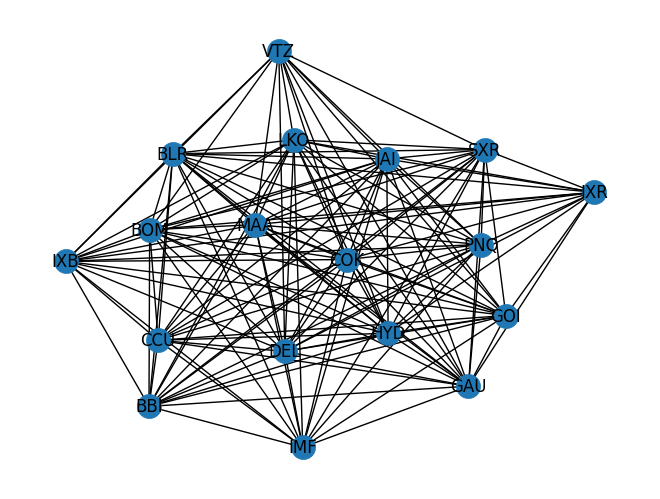

In [32]:
nx.draw(graph,with_labels = True)

In [33]:
len(graph.nodes),len(graph.edges)

(18, 141)

The number of nodes are the number of airport hubs or connections present in 
the airline network.So there are 18 connections as part of the AirAsia network.
The edges represent the flights flying between each airport hub. So there are 141 flight journeys/connections.These lines represent reciprocal relationships.

In [34]:
nx.is_directed(graph)

False

In [35]:
nx.is_weighted(graph)

False

In [36]:
degrees = dict(graph.degree())

In [37]:
from scipy.stats import norm

In [38]:
N=graph.number_of_nodes()
N

18

In [39]:
from networkx.generators.atlas import graph_atlas
P, K = graph.order(), graph.size()
avg_deg = float(K) / P

In [40]:
avg_deg

7.833333333333333

The average degree of a graph is just the average number of edges per node. Calculating this is not too difficult. I have used the built in networkx function to calculate it. But its just the total number of edges( 141) by the number of total nodes (18). Calculating the average degree helps produce a powerful to analyze the airline network. The average node 7.833 which in sense means that the number of connections between each connection is relatively high.
Since the graph network is not directed, the average degree calculation is more meaningful.

In [41]:
import json
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
%matplotlib inline
import requests

**CENTRALITY MEASURES**

With the aid of centrality measures, we are able to identify a graph's most significant nodes. In essence, this enables us to determine information-disseminating nodes that reach numerous nodes
centres in a network of transportation

**DEGREE CENTRALITY**

(array([2., 0., 1., 0., 0., 4., 0., 5., 0., 6.]),
 array([13. , 13.4, 13.8, 14.2, 14.6, 15. , 15.4, 15.8, 16.2, 16.6, 17. ]),
 <BarContainer object of 10 artists>)

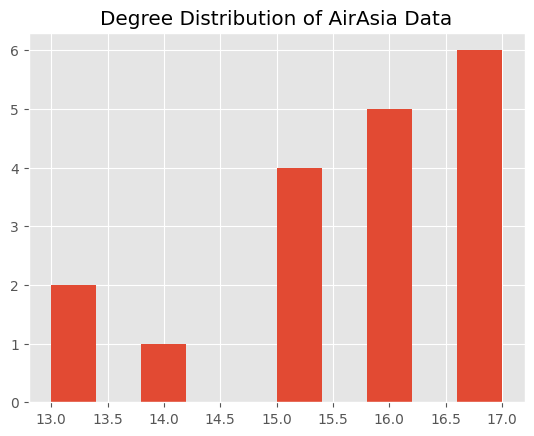

In [42]:
degrees = [graph.degree(n) for n in graph.nodes()]
plt.title('Degree Distribution of AirAsia Data')
plt.hist(degrees)

In [43]:
deg_centrality = nx.degree_centrality(graph)
print(deg_centrality)

{'LKO': 1.0, 'MAA': 1.0, 'BLR': 1.0, 'BBI': 0.8823529411764706, 'BOM': 0.9411764705882353, 'JAI': 1.0, 'GAU': 0.9411764705882353, 'GOI': 0.9411764705882353, 'IXB': 0.8823529411764706, 'IXR': 0.7647058823529411, 'DEL': 1.0, 'IMF': 0.8235294117647058, 'COK': 1.0, 'SXR': 0.9411764705882353, 'PNQ': 0.8823529411764706, 'HYD': 0.9411764705882353, 'CCU': 0.8823529411764706, 'VTZ': 0.7647058823529411}


In [44]:
for key, value in sorted(deg_centrality.items(), key=lambda kv: kv[1], reverse=True):
    print("%s: %s" % (key, value))

LKO: 1.0
MAA: 1.0
BLR: 1.0
JAI: 1.0
DEL: 1.0
COK: 1.0
BOM: 0.9411764705882353
GAU: 0.9411764705882353
GOI: 0.9411764705882353
SXR: 0.9411764705882353
HYD: 0.9411764705882353
BBI: 0.8823529411764706
IXB: 0.8823529411764706
PNQ: 0.8823529411764706
CCU: 0.8823529411764706
IMF: 0.8235294117647058
IXR: 0.7647058823529411
VTZ: 0.7647058823529411


Degree centrality assigns an importance score based simply on the number of links held by each node. In this case, it measures the number of flights connected to that specific airport hub. It explains how many direct, ‘one hop’ connections each node has to other nodes in the network. It shows us the very connected connections or popular airports.These nodes can help quickly connect with a wider network. In the above dictionary it is shown that 'LKO'(Lucknow),  'MAA'(Chennai), 'BLR'(Bangalore), 'JAI'(Jaipur),'DEL'(Delhi), 'COK'(Cochin) connections have the highest degree centrality of 1.0 compared to other connections in the dictionary. Whereas 'IXR'(Ranchi) and 'VTZ'(Visakhapatnam) connections have a less degree centrality which indicates that these airports have less number of flight connections throughout the network.

**CLOSENESS CENTRALITY**

In [45]:
close_centrality = nx.closeness_centrality(graph)
print(close_centrality)

{'LKO': 1.0, 'MAA': 1.0, 'BLR': 1.0, 'BBI': 0.8947368421052632, 'BOM': 0.9444444444444444, 'JAI': 1.0, 'GAU': 0.9444444444444444, 'GOI': 0.9444444444444444, 'IXB': 0.8947368421052632, 'IXR': 0.8095238095238095, 'DEL': 1.0, 'IMF': 0.85, 'COK': 1.0, 'SXR': 0.9444444444444444, 'PNQ': 0.8947368421052632, 'HYD': 0.9444444444444444, 'CCU': 0.8947368421052632, 'VTZ': 0.8095238095238095}


In [46]:
for key, value in sorted(close_centrality.items(), key=lambda kb: kb[1], reverse=True):
    print("%s: %s" % (key, value))

LKO: 1.0
MAA: 1.0
BLR: 1.0
JAI: 1.0
DEL: 1.0
COK: 1.0
BOM: 0.9444444444444444
GAU: 0.9444444444444444
GOI: 0.9444444444444444
SXR: 0.9444444444444444
HYD: 0.9444444444444444
BBI: 0.8947368421052632
IXB: 0.8947368421052632
PNQ: 0.8947368421052632
CCU: 0.8947368421052632
IMF: 0.85
IXR: 0.8095238095238095
VTZ: 0.8095238095238095


Closeness centrality describes how each node is given a score based on how "near" they are to all other nodes in the network. The shortest pathways connecting each node are determined using this metric, and each node is then given a score based on the sum of its shortest paths. or identifying the people most suited to quickly affect the entire network. 

**BETWEENNESS CENTRALITY**

In [47]:
bet_centrality = nx.betweenness_centrality(graph, normalized = True, 
                                              endpoints = False)
print(bet_centrality)

{'LKO': 0.006539538892480067, 'MAA': 0.006539538892480067, 'BLR': 0.006539538892480067, 'BBI': 0.0024859943977591035, 'BOM': 0.005559146735617323, 'JAI': 0.006539538892480067, 'GAU': 0.005559146735617323, 'GOI': 0.005559146735617323, 'IXB': 0.005559146735617323, 'IXR': 0.00196078431372549, 'DEL': 0.006539538892480067, 'IMF': 0.00196078431372549, 'COK': 0.006539538892480067, 'SXR': 0.005559146735617323, 'PNQ': 0.005559146735617323, 'HYD': 0.004788838612368024, 'CCU': 0.0024859943977591035, 'VTZ': 0.00196078431372549}


In [48]:
for key, value in sorted(bet_centrality.items(), key=lambda kb: kb[1], reverse=True):
    print("%s: %s" % (key, value))

LKO: 0.006539538892480067
MAA: 0.006539538892480067
BLR: 0.006539538892480067
JAI: 0.006539538892480067
DEL: 0.006539538892480067
COK: 0.006539538892480067
BOM: 0.005559146735617323
GAU: 0.005559146735617323
GOI: 0.005559146735617323
IXB: 0.005559146735617323
SXR: 0.005559146735617323
PNQ: 0.005559146735617323
HYD: 0.004788838612368024
BBI: 0.0024859943977591035
CCU: 0.0024859943977591035
IXR: 0.00196078431372549
IMF: 0.00196078431372549
VTZ: 0.00196078431372549


The amount of times a node is on the shortest path between other nodes is measured by betweenness centrality.This metric identifies the network nodes that act as "bridges" between other nodes. It accomplishes this by counting how many times each node is on each of the shortest paths after first identifying them.As seen above, the same set of airports have ranked as the top 5 airport connections having an impact on how the whole airline network system functions.

In [49]:
fig=px.histogram(df,
x="Connection",
color="Origin",
hover_data=df.columns,
title="Distribution of Flights based on Via/Connection",
barmode="group")
fig.show()

**Network Robustness**

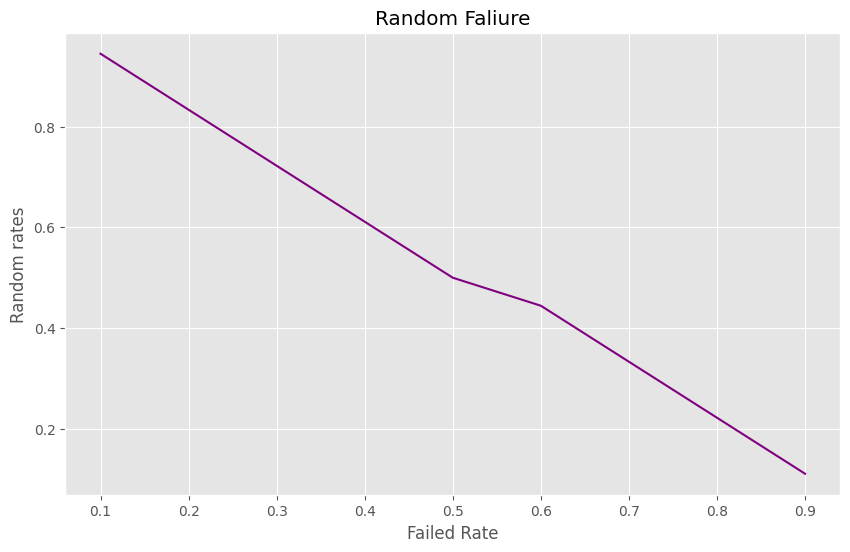

In [50]:
import numpy as np
import random as rm
V = list(graph.nodes())
N = len(V)
f = np.arange(0.1, 1, 0.1)
Random_Failures_values=[]
for i in f :
  N_failed = int(N * i)
  failed_nodes = rm.sample(V, N_failed)
  H = graph.copy()
  H.remove_nodes_from(failed_nodes)
  connected_comp = sorted(nx.connected_components(H), key=len, reverse=True)
  Random_Failure = len(connected_comp[0])/len(graph)
  Random_Failures_values.append(Random_Failure)
plt.rcParams["figure.figsize"] = (10,6)
plt.title("Random Faliure")
plt.xlabel("Failed Rate")
plt.ylabel("Random rates")
plt.plot(f,Random_Failures_values,color='Purple')
plt.show()

A network's resilience is measured by how many failures the nodes or links can withstand before breaking apart as a whole, disrupting its primary operation. Random failures in a network occurs when we only have information about the probability of failure between the links of the nodes and no info about the intercorrelation of these failures.These random failures occur when nodes or links fail at random.

In this situation, fc serves as a highly useful indicator of network robustness since it represents the critical failure rate over which the network fails.Here we have generated an array of fc rates from 0.1 to 1 as different values to obtain the approximate value.

The approximate value obtained by simulating random failures for different failure rates is around 0.6 as shown above in the graph.As before, we will focus on node percolation to establish the theory, with link percolation serving as an alternative

**Molloy-Reed Criterion**:
This result provides the integrity of the network.This can be done with thw absence or presence of the giant component situated in the network.

The formula for the ML criterion is:



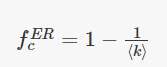

,where k is the average degree.

In [51]:
average_degree= (2*141/18)
average_degree

15.666666666666666

The main criterion for molloy-reed is that the average value of the whole network must be greater than 2 and we can see from the above calculation that our average degree is 15.6

In [52]:
molloy_reed_criterion= 1-(1/average_degree)
molloy_reed_criterion

0.9361702127659575

The failed rate would increase based on how dense the network is.The more the nodes that are present in the network,the more the failure rate would be.It depends on the density of the network and we need to remove the nodes.The perfect failed rate is 1. Hence the more closer the failed rate value is to 1,the more better the method is to break the network.From the above observations,we can see that the approximate vale(0.9) is much more closer to 1 when comparing it with the molloy-reed criterion.

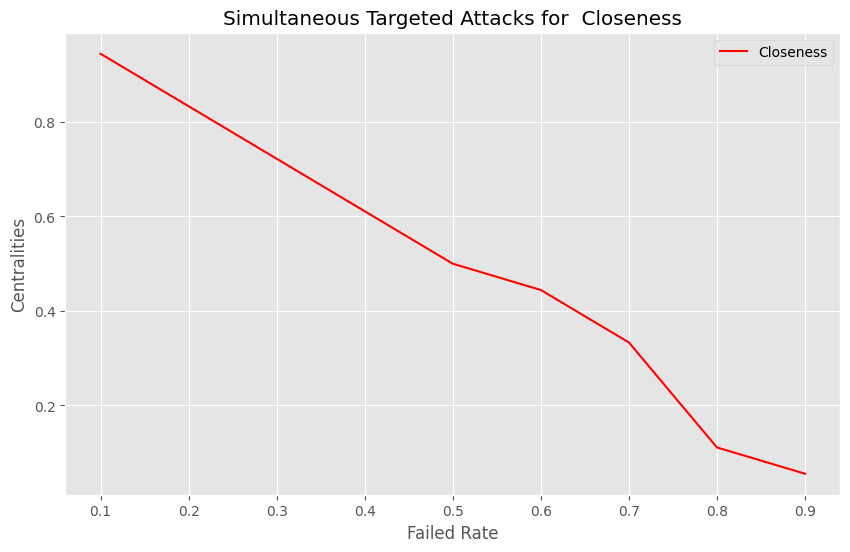

In [53]:
import numpy as np
import random as rm
P = list(graph.nodes())
R = len(P)
f = np.arange(0.1, 1, 0.1)
closeness_values=[]
for i in f :    
    N_failed_closeness = int(R * i)
    closeness_centrality = nx.closeness_centrality(graph)
    closeness_sort=dict(sorted(closeness_centrality.items(),key=lambda item: item[1], reverse=True))
    failed_closeness=list(closeness_sort)[0:N_failed_closeness]
    C = graph.copy()
    C.remove_nodes_from(failed_closeness)
    Hcc_close = sorted(nx.connected_components(C), key=len, reverse=True)
    closeness = len(Hcc_close[0])/len(graph)
    closeness_values.append(closeness)
plt.rcParams["figure.figsize"] = (10,6)
plt.plot(f,closeness_values,color='Red',label="Closeness")
plt.title("Simultaneous Targeted Attacks for  Closeness")
plt.xlabel("Failed Rate")
plt.ylabel("Centralities")
plt.legend()
plt.show()

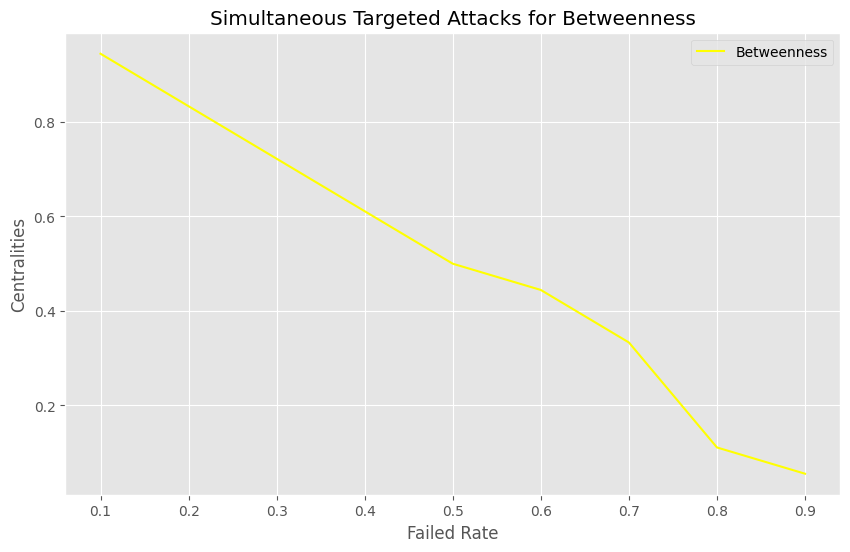

In [54]:
import numpy as np
import random as rm
P = list(graph.nodes())
R = len(P)
f = np.arange(0.1, 1, 0.1)
betweenness_values=[]
for k in f :    
    N_failed_betweeness = int(R * k)
    betweenness_centrality = nx.betweenness_centrality(graph)
    betweenness_sort=dict(sorted(betweenness_centrality.items(),key=lambda item: item[1], reverse=True))
    failed_betweeness=list(betweenness_sort)[0:N_failed_betweeness]
    B = graph.copy()
    B.remove_nodes_from(failed_betweeness)
    Hcc_between = sorted(nx.connected_components(B), key=len, reverse=True)
    betweenness = len(Hcc_between[0])/len(graph)
    betweenness_values.append(betweenness)
plt.rcParams["figure.figsize"] = (10,6)

plt.plot(f,betweenness_values,color='yellow',label="Betweenness")
plt.title("Simultaneous Targeted Attacks for Betweenness")
plt.xlabel("Failed Rate")
plt.ylabel("Centralities")
plt.legend()
plt.show()

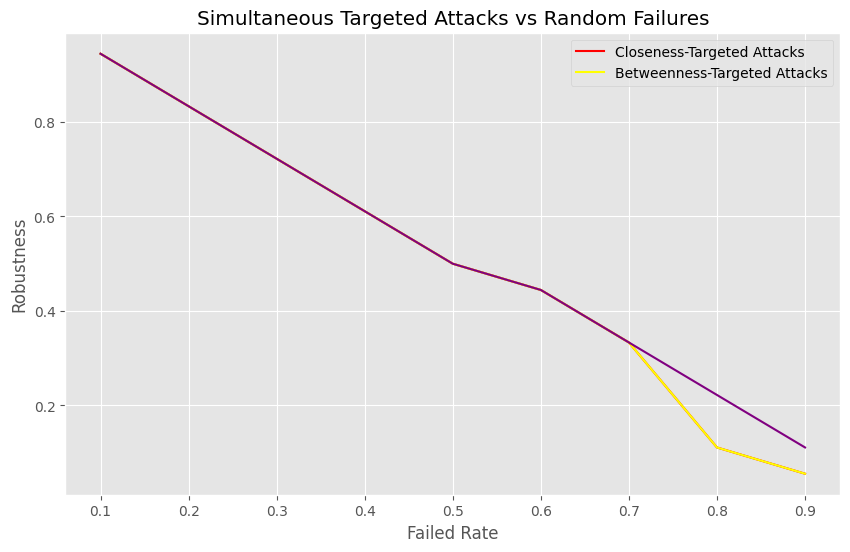

In [55]:
plt.rcParams["figure.figsize"] = (10,6)
plt.plot(f,closeness_values,color='Red',label="Closeness-Targeted Attacks")
plt.plot(f,betweenness_values,color='yellow',label="Betweenness-Targeted Attacks")
plt.plot(f,Random_Failures_values,color='Purple')
plt.title("Simultaneous Targeted Attacks vs Random Failures")
plt.xlabel("Failed Rate")
plt.ylabel("Robustness")
plt.legend()
plt.show()

In [56]:
import networkx as nx


# Calculate the degree distribution
degrees = [graph.degree(n) for n in graph.nodes()]

# Calculate the average shortest path length
avg_shortest_path_length = nx.average_shortest_path_length(graph)

# Calculate the clustering coefficient
clustering_coeff = nx.average_clustering(graph)




In [57]:
degrees

[17, 17, 17, 15, 16, 17, 16, 16, 15, 13, 17, 14, 17, 16, 15, 16, 15, 13]

In [58]:
avg_shortest_path_length

1.0784313725490196

In [59]:

clustering_coeff

0.9238900260959085

In [60]:
import networkx as nx


# Calculate the clustering coefficient for each node in the graph
clustering = nx.clustering(graph)

# Print the clustering coefficient for each node
for node, cc in clustering.items():
    print(f"Node {node}: Clustering coefficient = {cc}")

Node LKO: Clustering coefficient = 0.9117647058823529
Node MAA: Clustering coefficient = 0.9117647058823529
Node BLR: Clustering coefficient = 0.9117647058823529
Node BBI: Clustering coefficient = 0.9523809523809523
Node BOM: Clustering coefficient = 0.9166666666666666
Node JAI: Clustering coefficient = 0.9117647058823529
Node GAU: Clustering coefficient = 0.9166666666666666
Node GOI: Clustering coefficient = 0.9166666666666666
Node IXB: Clustering coefficient = 0.9047619047619048
Node IXR: Clustering coefficient = 0.9487179487179487
Node DEL: Clustering coefficient = 0.9117647058823529
Node IMF: Clustering coefficient = 0.9560439560439561
Node COK: Clustering coefficient = 0.9117647058823529
Node SXR: Clustering coefficient = 0.9166666666666666
Node PNQ: Clustering coefficient = 0.9047619047619048
Node HYD: Clustering coefficient = 0.925
Node CCU: Clustering coefficient = 0.9523809523809523
Node VTZ: Clustering coefficient = 0.9487179487179487


Watts-Strogatz graph:
Average clustering coefficient = 0.37433333333333335
Diameter = 10
Real-time data graph:
Average clustering coefficient = 0.9238900260959085
Diameter = 2


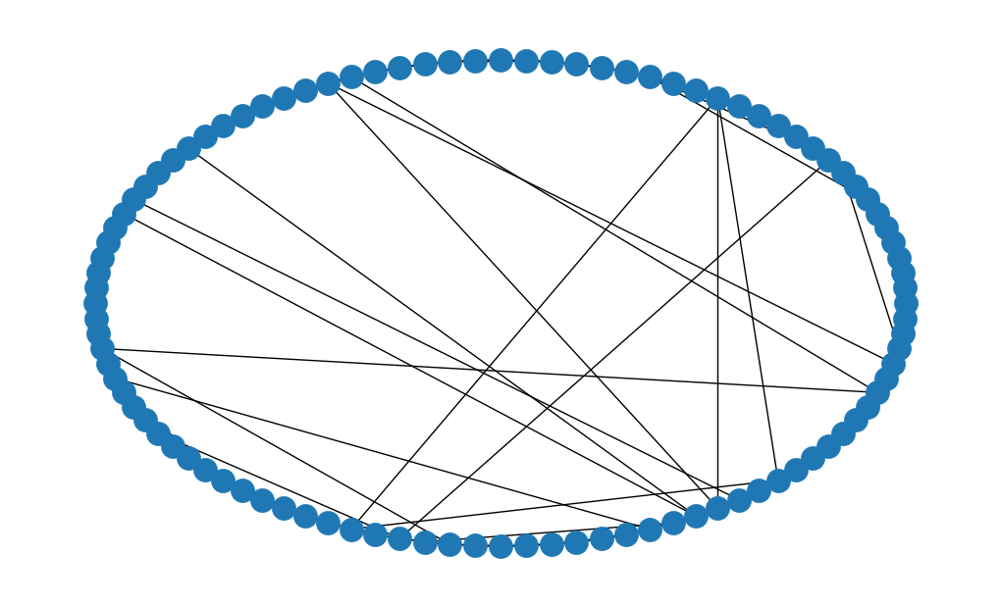

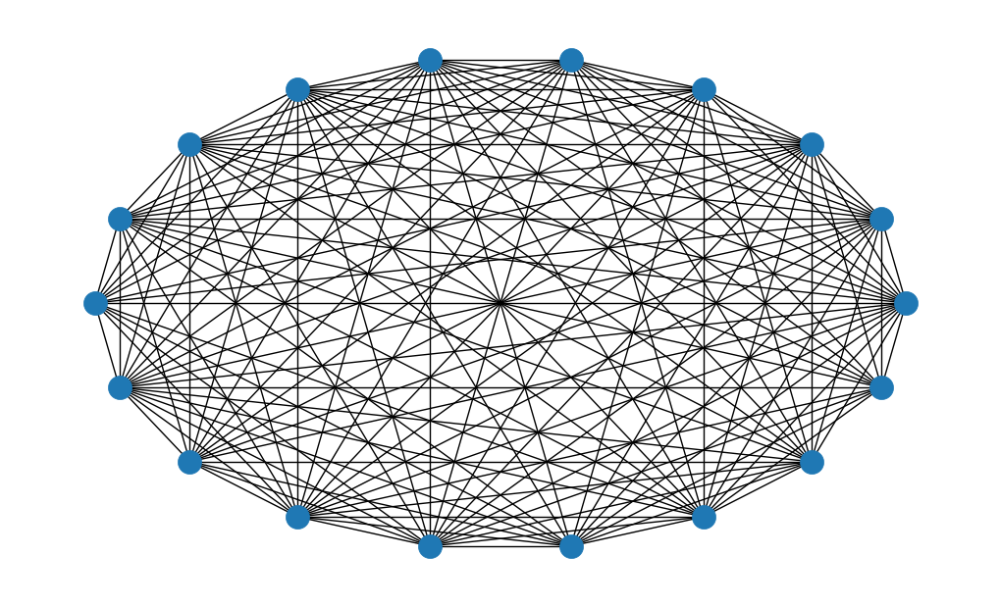

In [61]:
import networkx as nx
import matplotlib.pyplot as plt

# Generate a Watts-Strogatz graph
n = 100 # number of nodes
k = 4 # average degree of each node
p = 0.1 # rewiring probability
G_ws = nx.watts_strogatz_graph(n, k, p)

# Calculate some properties of the Watts-Strogatz graph
cc_ws = nx.average_clustering(G_ws)
diam_ws = nx.diameter(G_ws)

# Calculate some properties of your real-time data graph
cc_rt = nx.average_clustering(graph)
diam_rt = nx.diameter(graph)

# Print out the properties of both graphs
print("Watts-Strogatz graph:")
print(f"Average clustering coefficient = {cc_ws}")
print(f"Diameter = {diam_ws}")
print("Real-time data graph:")
print(f"Average clustering coefficient = {cc_rt}")
print(f"Diameter = {diam_rt}")

# Plot the Watts-Strogatz graph
nx.draw_circular(G_ws)
plt.show()

# Plot your real-time data graph
nx.draw_circular(graph)
plt.show()


In [62]:
pip install powerlaw


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [63]:
pip install powerlaw==1.3.4

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for powerlaw: filename=powerlaw-1.3.4-py3-none-any.whl size=22120 sha256=99688d3a30ce631194f82233cbf256495ea3ce7d0c0ea27c416556b35416262d
  Stored in directory: /root/.cache/pip/wheels/82/48/d2/4681cd1a9f85c22cbe2f68ffdca9ab10be09fdfe80345ad8e5
Successfully built powerlaw
  Attempting uninstall: powerlaw
    Found existing installation: powerlaw 1.5
    Uninstalling powerlaw-1.5:
      Successfully uninstalled powerlaw-1.5


In [64]:
import numpy as np
from scipy import stats

In [65]:
pip install python-igraph

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 53.0 MB/s eta 0:00:00
  Created wheel for python-igraph: filename=python_igraph-0.10.4-py3-none-any.whl size=9073 sha256=2fda6c1d10292341af813eb98bfcc07013adb219aa11ec364608416b9346d5ba
  Stored in directory: /root/.cache/pip/wheels/49/27/15/dcf90953e3e3322e6f3e447514b20cf39b53c6518cb4a7bace
Successfully built python-igraph


In [66]:
import networkx as nx

# Calculate the clustering coefficient of each node
cc = nx.clustering(graph)
# Calculate the average clustering coefficient of the network
avg_cc = sum(cc.values()) / len(cc)
# Calculate the global clustering coefficient of the network
global_cc = nx.transitivity(graph)

# Calculate the average cluster size of the network
avg_cs = avg_cc / global_cc

In [67]:
avg_cs

1.0023244397696758

In [68]:
from networkx.generators.random_graphs import erdos_renyi_graph


n = 18
p = 0.6
g = erdos_renyi_graph(n,p)

x= g.nodes
y=g.edges
print(x)
print(y)


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[(0, 1), (0, 2), (0, 6), (0, 8), (0, 9), (0, 11), (0, 12), (0, 14), (0, 15), (0, 16), (0, 17), (1, 2), (1, 3), (1, 4), (1, 5), (1, 7), (1, 10), (1, 11), (1, 12), (1, 14), (1, 17), (2, 3), (2, 7), (2, 10), (2, 14), (2, 17), (3, 5), (3, 6), (3, 7), (3, 9), (3, 10), (3, 11), (3, 12), (3, 17), (4, 7), (4, 10), (4, 11), (4, 12), (4, 14), (4, 15), (4, 17), (5, 7), (5, 9), (5, 10), (5, 14), (5, 15), (6, 7), (6, 9), (6, 12), (6, 14), (6, 16), (7, 8), (7, 12), (7, 13), (7, 15), (8, 11), (8, 13), (8, 14), (8, 17), (9, 10), (9, 11), (9, 13), (9, 14), (9, 17), (10, 17), (11, 12), (11, 15), (12, 13), (12, 14), (12, 16), (13, 14), (13, 15), (13, 16), (13, 17), (14, 17), (15, 17)]


In [69]:
from networkx.generators.random_graphs import erdos_renyi_graph


n = 18
p = 1.0
g = erdos_renyi_graph(n,p)

x= g.nodes
y=g.edges
print(x)
print(y)


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[(0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 11), (0, 12), (0, 13), (0, 14), (0, 15), (0, 16), (0, 17), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (1, 10), (1, 11), (1, 12), (1, 13), (1, 14), (1, 15), (1, 16), (1, 17), (2, 3), (2, 4), (2, 5), (2, 6), (2, 7), (2, 8), (2, 9), (2, 10), (2, 11), (2, 12), (2, 13), (2, 14), (2, 15), (2, 16), (2, 17), (3, 4), (3, 5), (3, 6), (3, 7), (3, 8), (3, 9), (3, 10), (3, 11), (3, 12), (3, 13), (3, 14), (3, 15), (3, 16), (3, 17), (4, 5), (4, 6), (4, 7), (4, 8), (4, 9), (4, 10), (4, 11), (4, 12), (4, 13), (4, 14), (4, 15), (4, 16), (4, 17), (5, 6), (5, 7), (5, 8), (5, 9), (5, 10), (5, 11), (5, 12), (5, 13), (5, 14), (5, 15), (5, 16), (5, 17), (6, 7), (6, 8), (6, 9), (6, 10), (6, 11), (6, 12), (6, 13), (6, 14), (6, 15), (6, 16), (6, 17), (7, 8), (7, 9), (7, 10), (7, 11), (7, 12), (7, 13), (7, 14), (7, 15), (7, 16), (7, 17), (8, 9), 

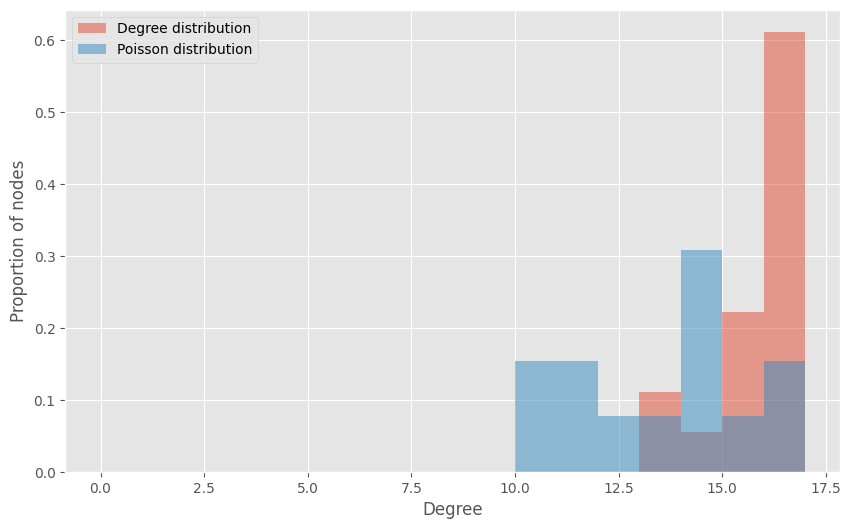

In [70]:
import networkx as nx
import matplotlib.pyplot as plt

# Load the graph and calculate the degree distribution
degrees = [graph.degree(n) for n in graph.nodes()]

# Calculate the expected Poisson distribution
mean_degree = np.mean(degrees)
poisson_dist = stats.poisson(mean_degree)
poisson_samples = poisson_dist.rvs(size=len(degrees))

# Plot the degree distribution and expected Poisson distribution
plt.hist(degrees, bins=range(max(degrees)+1), density=True, alpha=0.5, label="Degree distribution")
plt.hist(poisson_samples, bins=range(max(degrees)+1), density=True, alpha=0.5, label="Poisson distribution")
plt.xlabel("Degree")
plt.ylabel("Proportion of nodes")
plt.legend()
plt.show()


By plotting the degree distribution and expected Poisson distribution on the same graph in this way, you can visually compare the shapes of the two distributions and get a sense of whether the degree distribution of the graph is consistent with the Poisson distribution. If the two distributions are similar, this suggests that the degree distribution of the graph is consistent with the Poisson distribution. If the two distributions are significantly different, this suggests that the degree distribution of the graph is not consistent with the Poisson distribution.

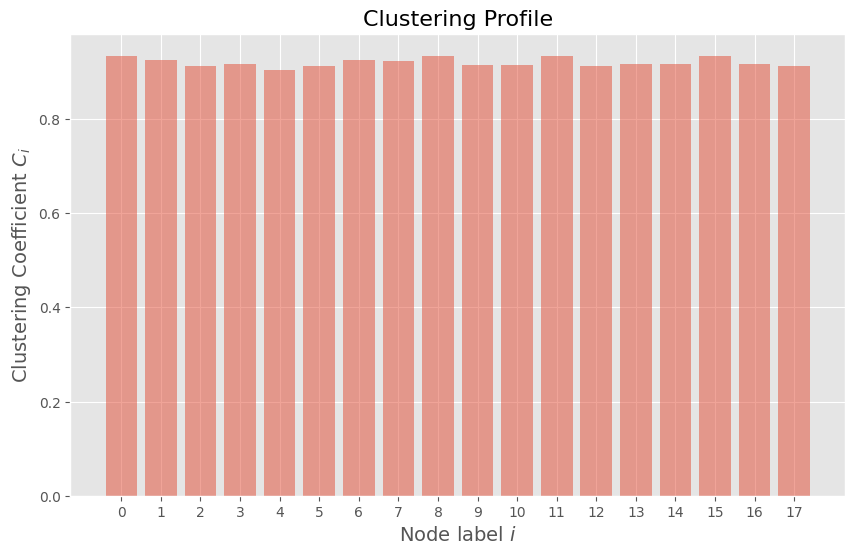

Average Clustering Coefficient: 0.9198
Average Distance: 1.08


In [71]:
N = 18
L = 141
G_N= nx.gnm_random_graph(N, L)
clustering_coefficients = nx.clustering(G_N).values()
node_labels = list(range(N)) 
plt.xlabel(r'Node label $i$', fontsize=14)
plt.xticks(node_labels)
plt.ylabel(r'Clustering Coefficient $C_i$', fontsize=14)
plt.title('Clustering Profile', fontsize=16)
plt.bar(node_labels, clustering_coefficients, align='center', alpha=0.5)
plt.show()

print(f'Average Clustering Coefficient: {nx.average_clustering(G_N):.4f}')
print(f'Average Distance: {nx.average_shortest_path_length(G_N):.2f}')

To model well with a real network , there should be atleast two crucial properties attained:


1.  High Clustering Coefficient
2.   Small World Property

The clustering coefficient gives information about what happens in the neighbourhood of a specific node.It tells us the measure of how well a node is connected.Let Ci be the clustering coeffient


*   If Ci= 0,none of the neighbors of the nodes link to each other.
*   If Ci= 1,all of the nodes link to each other.
*   If Ci= 0.5,there is a 50% chance of the nodes to link with each other


To characterise a network as a small world property, it must have small average distance.

In the above profile it can be observed that clustering coefficient is much smaller in value when compared to the average distance of the random G(n,L) network.





In [72]:
import networkx as nx


# Calculate the average shortest path length
avg_shortest_path_length = nx.average_shortest_path_length(graph)

print(avg_shortest_path_length)


1.0784313725490196


As a rough guideline, values of the average shortest path length that are significantly smaller than the number of nodes in the graph may be considered to be indicative of small-world properties. In this case, with 18 nodes in the graph, an average shortest path length of around 1.078 may be considered small-world behavior.

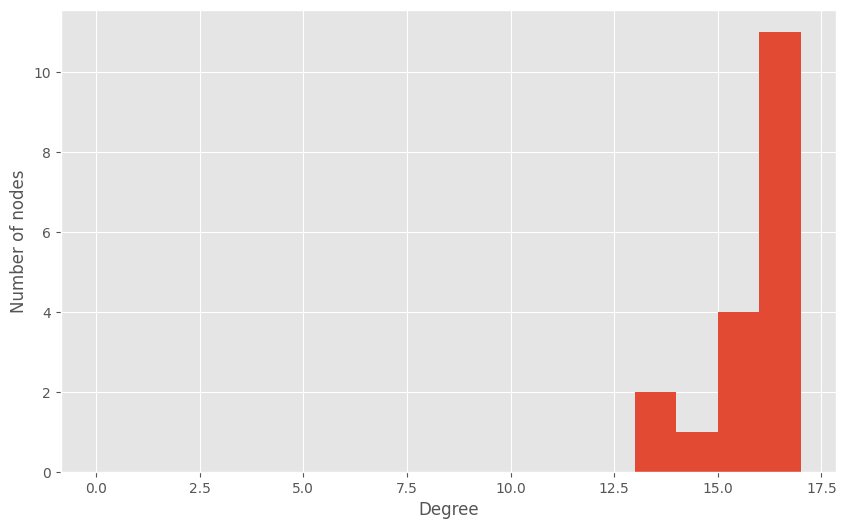

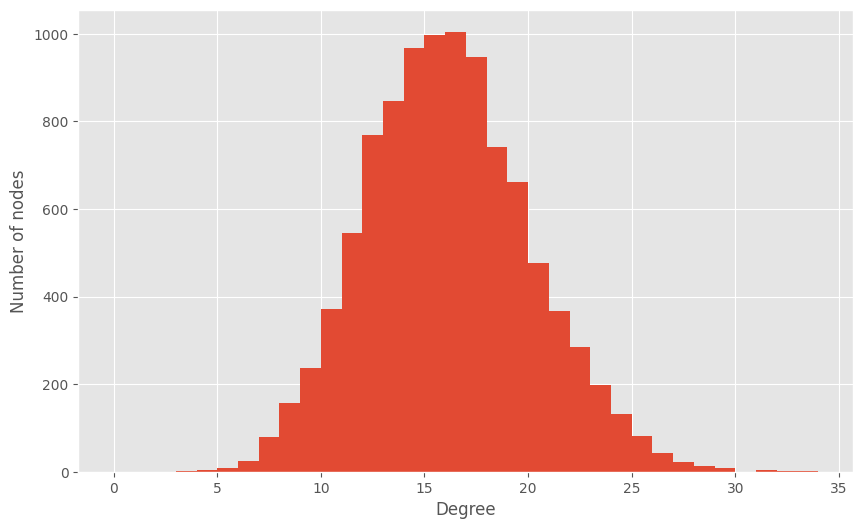

In [73]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
from scipy.stats import poisson
# Load the graph and calculate the degree distribution
degrees = [graph.degree(n) for n in graph.nodes()]

# Plot the degree distribution
plt.hist(degrees, bins=range(max(degrees)+1))
plt.xlabel("Degree")
plt.ylabel("Number of nodes")
plt.show()

# Calculate the expected Poisson distribution
mean_degree = np.mean(degrees)
poisson = stats.poisson(mean_degree)
samples = poisson.rvs(size=10000)
# Plot the expected Poisson distribution
plt.hist(samples, bins=range(max(samples)+1))
plt.xlabel("Degree")
plt.ylabel("Number of nodes")
plt.show()


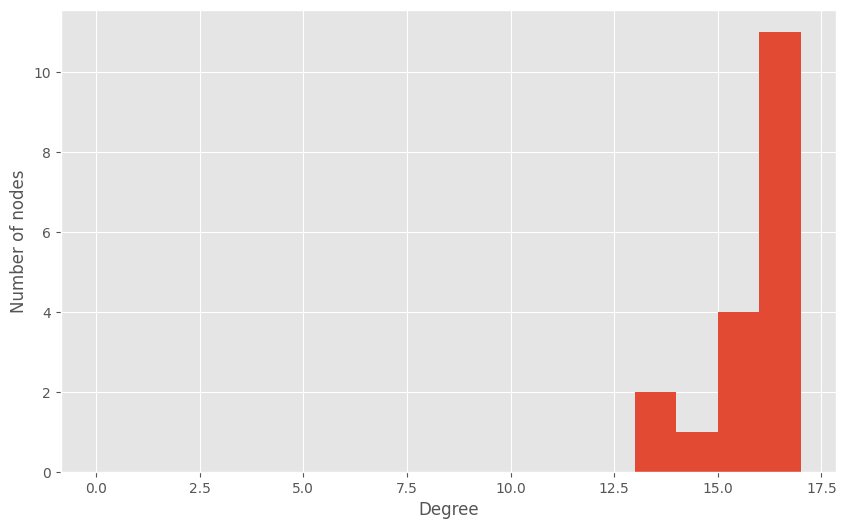

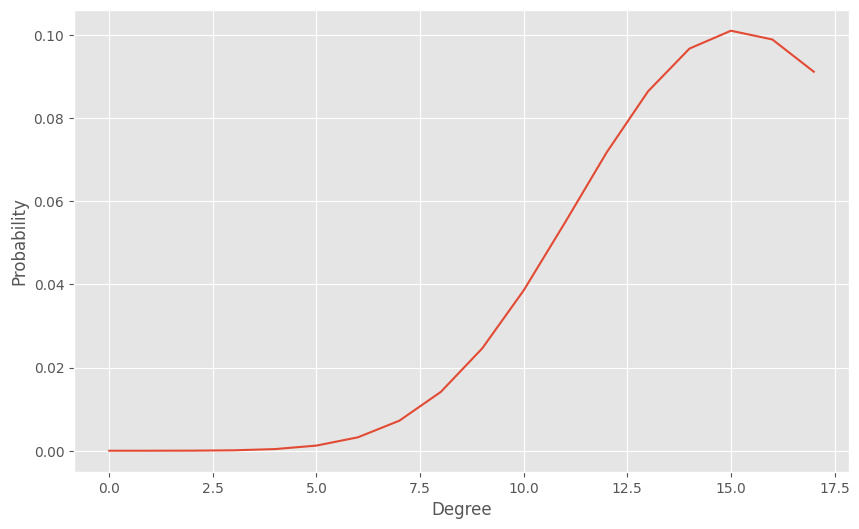

In [74]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats

# Load the graph and calculate the degree distribution

degrees = [graph.degree(n) for n in graph.nodes()]

# Plot the degree distribution
plt.hist(degrees, bins=range(max(degrees)+1))
plt.xlabel("Degree")
plt.ylabel("Number of nodes")
plt.show()

# Calculate the expected Poisson distribution
mean_degree = np.mean(degrees)
poisson = stats.poisson(mean_degree)

# Plot the expected Poisson distribution
x = range(max(degrees)+1)
y = poisson.pmf(x)
plt.plot(x, y)
plt.xlabel("Degree")
plt.ylabel("Probability")
plt.show()


By comparing the degree distribution of the graph to the expected Poisson distribution, you can get a sense of whether the graph is consistent with a random graph or not. If the degree distribution follows the expected Poisson distribution closely, it is more likely that the graph is a random graph. If there are significant deviations from the expected Poisson distribution, it is less likely that the graph is a random graph.